# Analiza danych przestrzennych - ćwiczenia laboratoryjne 2024/2025

Ten notatnik zalicza się do grupy zestawów zadań, na podstawie których odbywa się zaliczenie ćwiczeń i podlega zwrotowi do oceny w ustalonym na zajęciach terminie.

Uwagi i wytyczne ogólne dotyczące uzupełniania i oceny notatnika:
- Podczas wykonywania zadań należy korzystać wyłącznie z pakietów zaimportowanych na początku notatnika oraz z pakietów wchodzących w skład standardowej biblioteki Pythona, które można zaimportować samodzielnie we wskazanej komórce notatnika.
- Swoje rozwiązania należy wprowadzać wyłącznie w miejce następujących fragmentów kodu:<br/> `# YOUR CODE HERE`<br/> `raise NotImplementedError()`<br/> 
a odpowiedzi tekstowe w komórkach oznaczonych hasłem:<br/> 
`YOUR ANSWER HERE`<br/> 
Nie należy w żaden sposób modyfikować pozostałych fragmentów kodu oraz innych elementów notatnika, w szczególności dodawać lub usuwać komórek oraz zmieniać nazwy pliku.
- Jeżeli zestaw zadań wymaga skorzystania z fragmentów kodu opracowanego w ramach wcześniejszych zestawów zadań należy je umieścić we wskazanej komórce notatnika.
- Otrzymywane wyniki i odpowiedzi mają być rezultatem wykonania napisanego kodu, odpowiedzi uzupełniane manualnie nie podlegają ocenie.
- Zawarte w notatniku automatyczne testy mają charakter poglądowy. Dotyczą one wybranych aspektów zadań i mają na celu wyłapać podstawowe błędy. Przejście przez kod wszystkich testów nie oznacza, że zadanie jest wykonane w całości poprawnie i zostanie ocenione na maksymalną liczbę punktów.
- Zadania należy wykonać w taki sposób, aby podczas wykonywania kodu nie zostały wyświetlone żadne ostrzeżenia.
- Zadania, które powodują wyświetlenie komunikatu o błędzie przerywającym wykonywanie kodu nie podlegają ocenie.

Uwagi i wytyczne ogólne dotyczące wizualizacji wyników:
- Wszystkie wykresy powinny być wykonane w jednolitym, przejrzystym i czytelnym stylu, posiadać odpowiednio dobrane proporcje i zakresy wartości osi.
- Figury powinny mieć ustawione białe tło, tak, aby niezależnie od ustawień notatnika wszystkie elementy wykresów były dobrze widoczne (domyślnie tło jest przeźroczyste co może powodować problemy w notatnikach z ustawionym ciemnym tłem). Rozmiar poziomy figur nie powinien przekraczać 20 cali.
- Wykresy oraz ich osie powinny mieć nadane tytuły. Jeżeli w obrębie figury znajduje się więcej niż jeden wykres to figura również powinna mieć nadany tytuł.
- Zakresy osi wykresów przedstawiających rozkłady punktów w przestrzeni powinny być docięte do granic obszaru, na którym został wygenerowany proces punktowy.
- Proporcje osi wykresów przedstawiających rozkłady punktów w przestrzeni powinny być dobrane tak, aby wykresy odzwierciedlały rzeczywisty rozkład punktów w przestrzeni. Nie należy osiągać tego efektu manipulując rozmiarem całej figury.

Przed odesłaniem zestawu zadań do oceny proszę uzupełnić komórkę z danymi autorów rozwiązania (nazwa zespołu oraz imiona, nazwiska i numery indeksów członków zespołu) oraz upewnić się, że notatnik działa zgodnie z oczekiwaniami. W tym celu należy skorzystać z opcji **Restart Kernel and Run All Cells...** dostępnej na górnej belce notatnika pod symbolem $\blacktriangleright\blacktriangleright$.

---

## Zestaw zadań 8: Analiza danych przestrzennych z wykorzystaniem dedykowanych pakietów (część 2)

In [4]:
import numpy as np
import pandas as pd
import scipy as sp
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import contextily as cx

In [5]:
# Miejsce do importu pakietów wchodzących w skład standardowej biblioteki Pythona oraz ustawienie opcji wykorzystywanych pakietów

### Wczytanie danych

Załączone do notatnika pliki zawierają dane niezbędne do wykonania zadań. W celu wczytania danych do notatnika umieść pliki w tym samym folderze, w którym znajduje się notatnik.

In [7]:
# Wczytanie danych
wojewodztwa_geometria = gpd.read_file("Wojewodztwa_geometria.zip", encoding="utf-8")
wojewodztwa_dane = pd.read_csv("Wojewodztwa_dane.csv", delimiter=";", encoding="utf-8")

### Zadanie 1: Import i przygotowanie danych (5 pkt)

Przygotuj dwie tablice geopandas:
 - `wojewodztwa` - zawierającą komplet unikalnych kolumn z tablic `wojewodztwa_geometria` i `wojewodztwa_dane`.
 - `markery` - zawierającą identyczne dane jak tablica `wojewodztwa` za wyjątkiem kolumny "geometry", w której zamiast poligonów województw mają się znaleźć ich centroidy.

Skonwertuj dane w tablicach do układu odniesienia epsg:3857.

Uwagi do wykonania zadania:
 - Podczas łączenia danych zwróć uwagę, że wiersze w obu tablicach nie są ułożone w tej samej kolejności.
 - Podczas rozwiązywania zadania przydatne mogą się okazać funkcje i własności: `pandas.DataFrame.sort_values()`, `pandas.DataFrame.reset_index()`, `pandas.DataFrame.columns` ,`pandas.concat()` oraz `geopandas.GeoSeries.centroid`.

In [9]:
# Województwa
if wojewodztwa_geometria.crs != "epsg:3857":
    wojewodztwa_geometria = wojewodztwa_geometria.to_crs("epsg:3857")

wojewodztwa_dane=wojewodztwa_dane.sort_values(by=["Nazwa"]).reset_index(drop=True)
wojewodztwa_dane = wojewodztwa_dane.drop(wojewodztwa_dane.columns[0],axis=1) 
wojewodztwa_geometria= wojewodztwa_geometria.sort_values(by=["Nazwa"]).reset_index(drop=True)
wojewodztwa = pd.concat([wojewodztwa_geometria,wojewodztwa_dane],axis=1)

In [10]:
# Markery
markery = wojewodztwa.copy()
markery["geometry"] = markery["geometry"].centroid

In [11]:
# Komórka testowa
assert type(wojewodztwa) == gpd.geodataframe.GeoDataFrame
assert wojewodztwa.shape == (16, 16)
assert set(list(wojewodztwa.columns)) == set(['Nazwa', 'geometry', 'Gminy', 'Miasta', 'Miejscowości',
                                           'Powierzchnia ogółem [ha]', 'Produkcja energii elektrycznej [GWh]',
                                           'Stosunek produkcji energii elektrycznej do zużycia energii elektrycznej [%]',
                                           'Udział energii odnawialnej w produkcji energii elektrycznej [%]',
                                           'Udział powierzchni gruntów pod wodami w powierzchni ogółem [%]',
                                           'Udział powierzchni nieużytków w powierzchni ogółem [%]',
                                           'Udział powierzchni terenów mieszkaniowych w powierzchni ogółem [%]',
                                           'Udział powierzchni terenów przemysłowych w powierzchni ogółem [%]',
                                           'Udział powierzchni terenów rekreacji i wypoczynku w powierzchni ogółem [%]',
                                           'Udział powierzchni użytków rolnych w powierzchni ogółem [%]',
                                           'Zużycie energii elektrycznej [GWh]'])
assert wojewodztwa[wojewodztwa['Nazwa']=="dolnośląskie"]["Powierzchnia ogółem [ha]"].values[0] == 1994704
assert wojewodztwa[wojewodztwa['Nazwa']=="lubuskie"]["Miasta"].values[0] == 43

assert wojewodztwa.crs == "epsg:3857"

assert type(markery) == gpd.geodataframe.GeoDataFrame
assert markery.shape == (16, 16)
assert set(list(markery.columns)) == set(['Nazwa', 'geometry', 'Gminy', 'Miasta', 'Miejscowości',
                                           'Powierzchnia ogółem [ha]', 'Produkcja energii elektrycznej [GWh]',
                                           'Stosunek produkcji energii elektrycznej do zużycia energii elektrycznej [%]',
                                           'Udział energii odnawialnej w produkcji energii elektrycznej [%]',
                                           'Udział powierzchni gruntów pod wodami w powierzchni ogółem [%]',
                                           'Udział powierzchni nieużytków w powierzchni ogółem [%]',
                                           'Udział powierzchni terenów mieszkaniowych w powierzchni ogółem [%]',
                                           'Udział powierzchni terenów przemysłowych w powierzchni ogółem [%]',
                                           'Udział powierzchni terenów rekreacji i wypoczynku w powierzchni ogółem [%]',
                                           'Udział powierzchni użytków rolnych w powierzchni ogółem [%]',
                                           'Zużycie energii elektrycznej [GWh]'])
assert markery[markery['Nazwa']=="dolnośląskie"]["Powierzchnia ogółem [ha]"].values[0] == 1994704
assert markery[markery['Nazwa']=="lubuskie"]["Miasta"].values[0] == 43

assert markery.crs == "epsg:3857"

### Zadanie 2: Mapa z dodatkową informacją (3 pkt)
Korzystając z funkcji pakietu matplotlib oraz funkcji `geopandas.GeoDataFrame.plot()` przygotuj figurę, na której na poligony województw będą nałożone koła, których środek jest zlokalizowany w centroidzie województwa, a wielkość jest uzależniona od liczby miast w obrębie danego województwa. Ustaw parametry wykresu oraz wizualizowanych obiektów (wielkość figury, kolory, grubość linii, wielkość punktów itp.) tak, aby wygenerowana mapa była przejrzysta i czytelna.

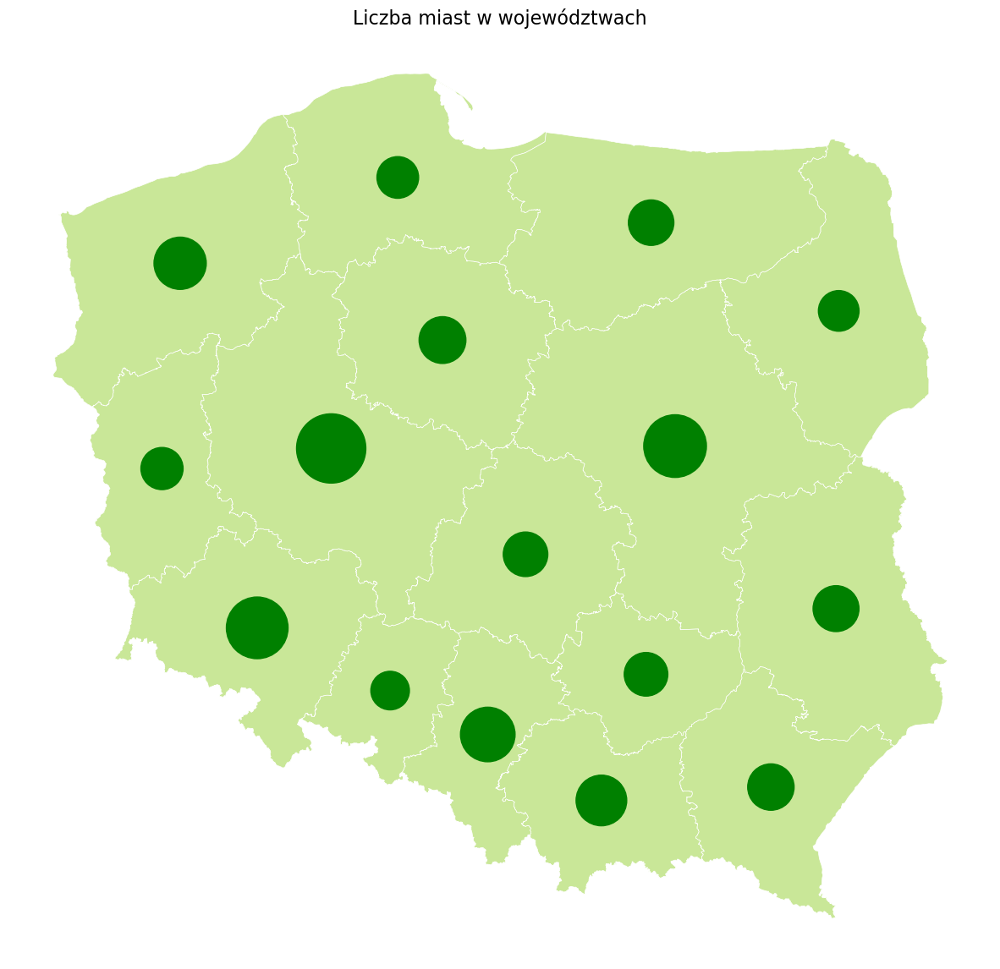

In [13]:
# YOUR CODE HERE
fig, ax = plt.subplots(figsize=(15, 15))
wojewodztwa.plot(ax=ax, color="#C9E798", edgecolor="white", linewidth=0.5)
markery.plot(ax=ax, markersize=30*markery["Miasta"], color="green")
ax.set_axis_off()
ax.set_title("Liczba miast w województwach", fontsize=16)
plt.show()

### Zadanie 3: Wizualizacja z mapą w tle (3 pkt)

Korzystając z funkcji pakietu matplotlib, funkcji `geopandas.GeoDataFrame.plot()` oraz funkcji `contextily.add_basemap()` przygotuj figurę, na której półprzeźroczyste poligony województw będą nałożone na wybraną (i inną niż domyślna) mapę topograficzną. Ustaw parametry wykresu oraz wizualizowanych obiektów (wielkość figury, kolory, grubość linii, wielkość punktów itp.) tak, aby wygenerowana mapa była przejrzysta i czytelna.

Uwagi do wykonania zadania:
- Wybierz dokładność mapy topograficznej tak, żeby nie była rozpikselowana, ale jednocześnie nie wczytywała się nadmiernie długo.

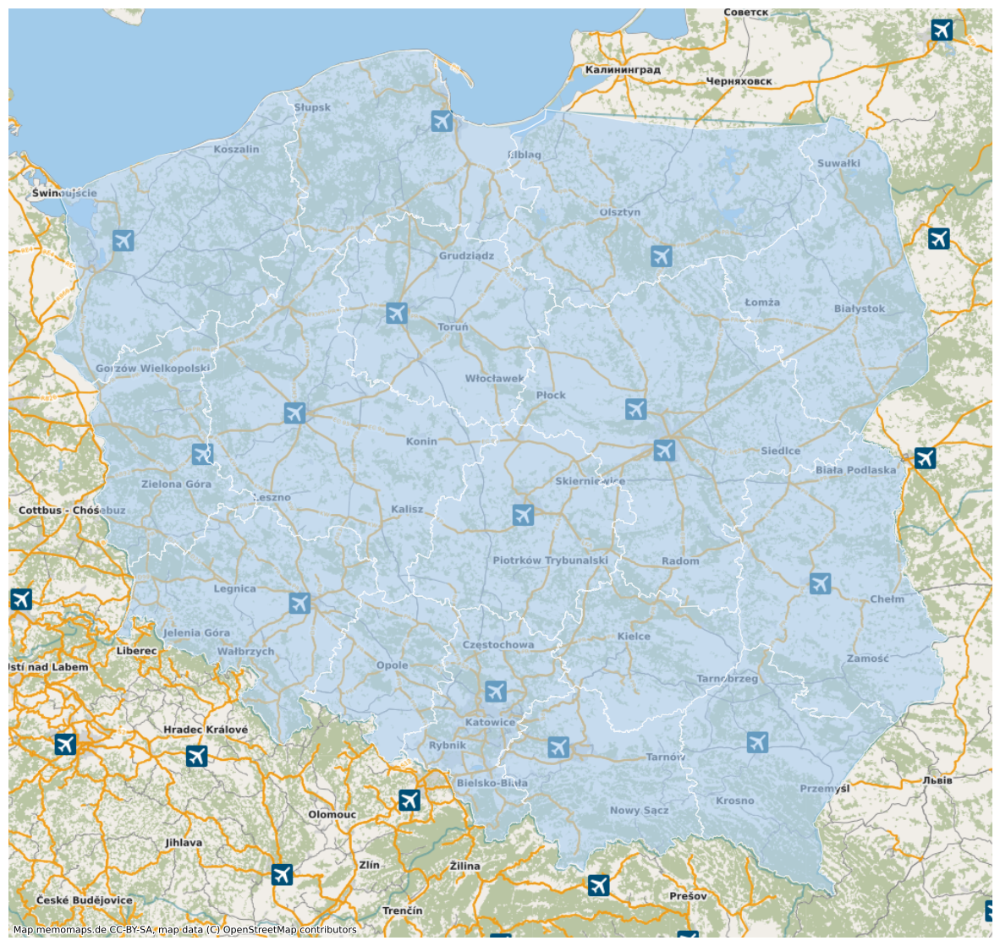

In [15]:
# YOUR CODE HERE
fig, ax = plt.subplots(figsize=(15,15))
wojewodztwa.plot(ax=ax, alpha=0.6, edgecolor='white', color="#AACFF3")
cx.add_basemap(ax=ax, source=cx.providers.OPNVKarte)  
ax.set_axis_off()

### Zadanie 4: Interaktywna wizualizacja (4 pkt)

Korzystając z funkcji `geopandas.GeoDataFrame.explore()` wykonaj interaktywną mapę, taką że:
 - kolor województw jest związany z ich powierzchnią,
 - po najechaniu myszką na obszar województwa wyświetla się jego nazwa,
 - po kliknięciu na obszar województwa wyświetla się lista 4 informacji związanych z produkcją i zużyciem energii na terenie danego województwa,
 - w tle znajduje się samodzielnie wybrana (inna od domyślnej) mapa.

In [17]:
# YOUR CODE HERE
wojewodztwa.explore(
    "Powierzchnia ogółem [ha]", 
    tiles = "CartoDB dark_matter",
    cmap = 'Wistia', 
    tooltip=1, 
    popup=["Produkcja energii elektrycznej [GWh]",  "Zużycie energii elektrycznej [GWh]",
           "Udział energii odnawialnej w produkcji energii elektrycznej [%]", 
           "Stosunek produkcji energii elektrycznej do zużycia energii elektrycznej [%]"],
)